In [1]:
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
np.random.seed(2)
from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix

In [15]:
import tensorflow as tf
import keras

print("TensorFlow version:", tf.__version__)
print("Keras version:", keras.__version__)


TensorFlow version: 2.20.0
Keras version: 3.11.3


In [4]:
# from keras.utils.np_utils import to_categorical
from tensorflow.keras.utils import to_categorical

from keras.models import Sequential
from keras.layers import Dense, Flatten, Conv2D, MaxPool2D, Dropout
from keras.optimizers import Adam
# from keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.preprocessing.image import ImageDataGenerator


In [5]:
#from keras.callbacks import EarlyS
from keras.callbacks import EarlyStopping

In [6]:
from PIL import Image, ImageChops, ImageEnhance
import os
import itertools

In [7]:
def convert_to_ela_image(path, quality):
    temp_filename = 'temp_file_name.jpg'
    ela_filename = 'temp_ela.png'
    
    image = Image.open(path).convert('RGB')
    image.save(temp_filename, 'JPEG', quality = quality)
    temp_image = Image.open(temp_filename)
    
    ela_image = ImageChops.difference(image, temp_image)
    
    extrema = ela_image.getextrema()
    max_diff = max([ex[1] for ex in extrema])
    if max_diff == 0:
        max_diff = 1
    scale = 255.0 / max_diff
    
    ela_image = ImageEnhance.Brightness(ela_image).enhance(scale)
    
    return ela_image

In [8]:
import tensorflow as tf
class Config:
    CASIA1 = "../input/casia-dataset/CASIA1"
    CASIA2 = "../input/casia-dataset/CASIA2"
    autotune = tf.data.experimental.AUTOTUNE
    epochs = 30
    batch_size = 32
    lr = 1e-3
    name = 'xception'
    n_labels = 2
    image_size = (224, 224)
    decay = 1e-6
    momentum = 0.95
    nesterov = False

In [13]:
!pwd

/c/Users/melya/OneDrive/Desktop/projects/BS Project


In [14]:
!ls

README.md
image-forgery-detection (1).ipynb
main.py
pyproject.toml
uv.lock


In [9]:
def compute_ela_cv(path, quality):
    temp_filename = 'temp_file_name.jpg'
    SCALE = 15
    orig_img = cv2.imread(path)
    orig_img = cv2.cvtColor(orig_img, cv2.COLOR_BGR2RGB)
    
    cv2.imwrite(temp_filename, orig_img, [cv2.IMWRITE_JPEG_QUALITY, quality])

    # read compressed image
    compressed_img = cv2.imread(temp_filename)

    # get absolute difference between img1 and img2 and multiply by scale
    diff = SCALE * cv2.absdiff(orig_img, compressed_img)
    return diff

In [10]:
def random_sample(path, extension=None):
    if extension:
        items = Path(path).glob(f'*.{extension}')
    else:
        items = Path(path).glob(f'*')
        
    items = list(items)
        
    p = random.choice(items)
    return p.as_posix()

# Test on a Authentic image

In [12]:
import cv2
from os.path import join
from pathlib import Path
import random
import matplotlib.pyplot as plt  # Importing matplotlib.pyplot

# Assuming Config.CASIA2 and random_sample() are defined elsewhere in your code

# Your existing code continues from here
p = join(Config.CASIA2, 'Au/')
p = random_sample(p)
orig = cv2.imread(p)
orig = cv2.cvtColor(orig, cv2.COLOR_BGR2RGB) / 255.0
init_val = 100
columns = 3
rows = 3

fig = plt.figure(figsize=(15, 10))
for i in range(1, columns * rows + 1):
    quality = init_val - (i - 1) * 3
    # Assuming compute_ela_cv is defined elsewhere in your code
    img = compute_ela_cv(path=p, quality=quality)
    if i == 1:
        img = orig.copy()
    ax = fig.add_subplot(rows, columns, i)
    ax.title.set_text(f'q: {quality}')
    plt.imshow(img)
plt.show()


IndexError: Cannot choose from an empty sequence

# Test on a tampered fake image

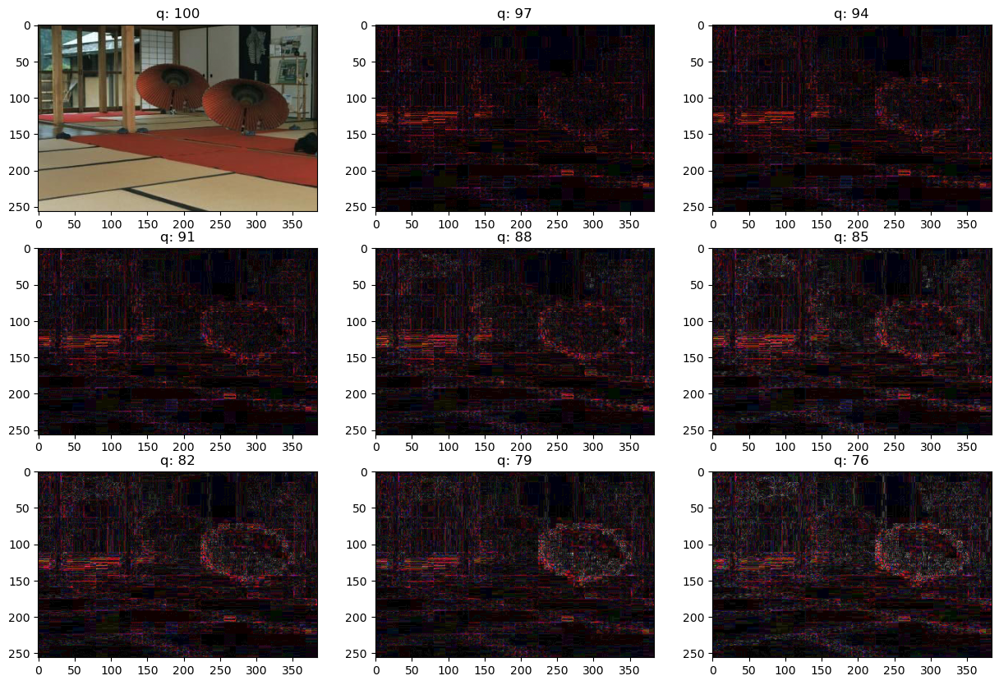

In [11]:
p = join(Config.CASIA2, 'Tp/')
p = random_sample(p)
orig = cv2.imread(p)
orig = cv2.cvtColor(orig, cv2.COLOR_BGR2RGB) / 255.0
init_val = 100
columns = 3
rows = 3

fig=plt.figure(figsize=(15, 10))
for i in range(1, columns*rows +1):
    quality=init_val - (i-1) * 3
    img = compute_ela_cv(path=p, quality=quality)
    if i == 1:
        img = orig.copy()
    ax = fig.add_subplot(rows, columns, i) 
    ax.title.set_text(f'q: {quality}')
    plt.imshow(img)
plt.show()

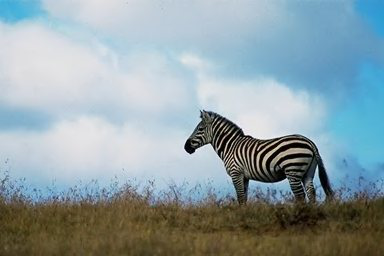

In [12]:
real_image_path = '../input/casia-dataset/CASIA2/Au/Au_ani_00001.jpg'
Image.open(real_image_path)

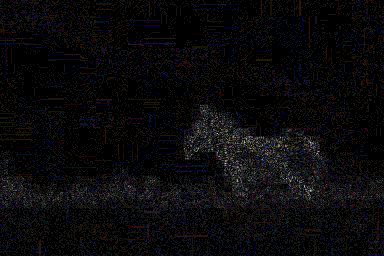

In [13]:
convert_to_ela_image(real_image_path, 91)

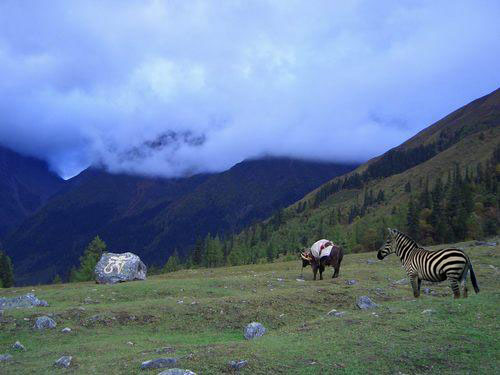

In [14]:
fake_image_path = '../input/casia-dataset/CASIA2/Tp/Tp_D_NRN_S_N_ani10171_ani00001_12458.jpg'
Image.open(fake_image_path)

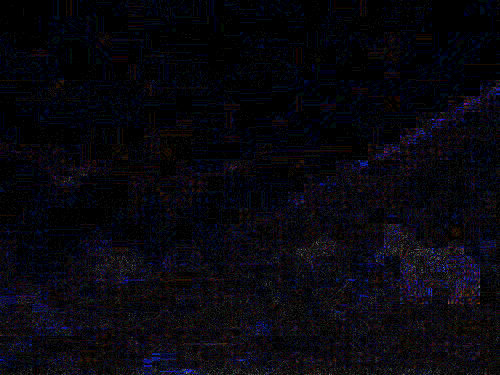

In [15]:
convert_to_ela_image(fake_image_path, 91)

DENOISING REAL IMAGE

In [16]:
# Color-image denoising
from skimage.restoration import denoise_wavelet, estimate_sigma
from skimage.util import random_noise
import skimage.io

img_r1 = skimage.io.imread('../input/casia-dataset/CASIA2/Au/Au_ani_00001.jpg')
img_r = skimage.img_as_float(img_r1)  # Converting image as float

sigma_est = estimate_sigma(img_r, channel_axis=-1, average_sigmas=True)  # Noise estimation

# Denoising using Bayes
img_bayes = denoise_wavelet(img_r, method='BayesShrink', mode='soft', wavelet_levels=3,
                             wavelet='coif5', channel_axis=-1, convert2ycbcr=True, rescale_sigma=True)

# Denoising using Visushrink
img_visushrink = denoise_wavelet(img_r, method='VisuShrink', mode='soft', sigma=sigma_est/3, wavelet_levels=5,
                                  wavelet='coif5', channel_axis=-1, convert2ycbcr=True, rescale_sigma=True)


/opt/conda/lib/python3.7/site-packages/pywt/_multilevel.py:45: UserWarning: Level value of 5 is too high: all coefficients will experience boundary effects.
  "boundary effects.").format(level))


In [17]:
import cv2
psnr_noisy = cv2.PSNR(img_r,img_r)
psnr_noisy

361.20199909921956

In [18]:
psnr_bayes = cv2.PSNR(img_r,img_bayes)
psnr_bayes

124.60573219905689

In [19]:
psnr_visu = cv2.PSNR(img_r,img_visushrink)
psnr_visu

100.08271190521796

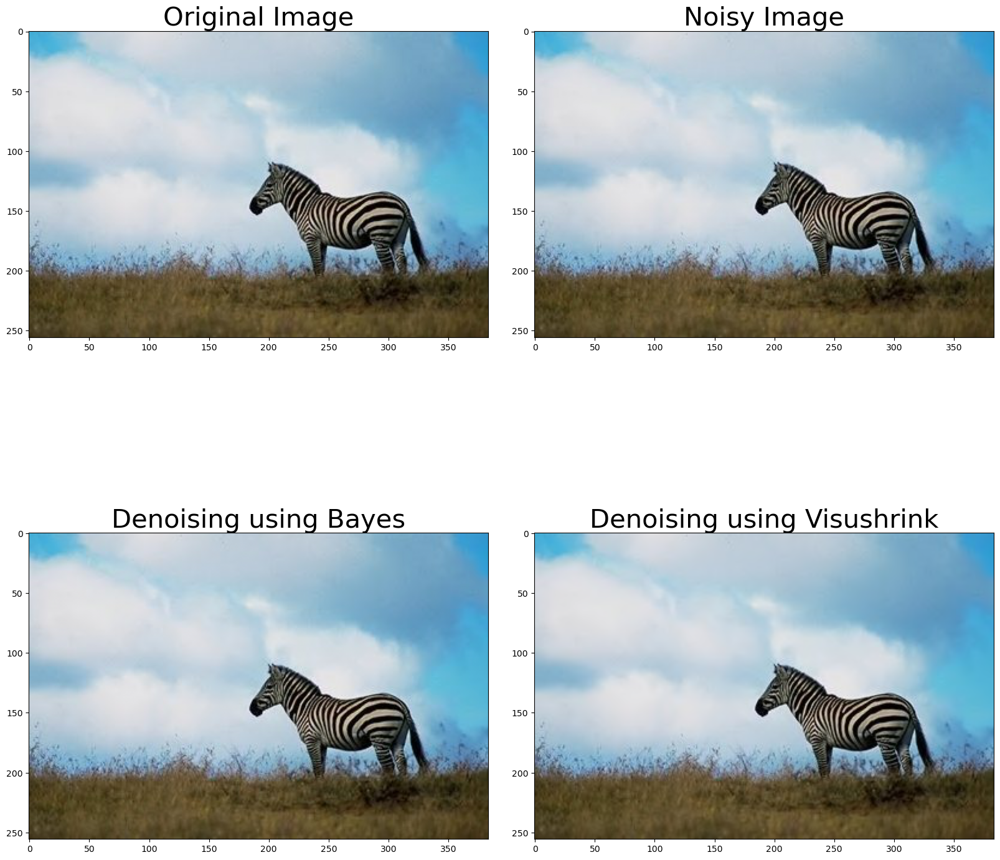

In [20]:
plt.figure(figsize=(20,20))  # Reduced the figsize for a more compact layout

# Adjust the space between subplots
plt.subplots_adjust(wspace=0.1, hspace=0.1)

plt.subplot(2,2,1)
plt.imshow(img_r1, cmap=plt.cm.gray)
plt.title('Original Image', fontsize=30)

plt.subplot(2,2,2)
plt.imshow(img_r, cmap=plt.cm.gray)
plt.title('Noisy Image', fontsize=30)

plt.subplot(2,2,3)
plt.imshow(img_bayes, cmap=plt.cm.gray)
plt.title('Denoising using Bayes', fontsize=30)

plt.subplot(2,2,4)
plt.imshow(img_visushrink, cmap=plt.cm.gray)
plt.title('Denoising using Visushrink', fontsize=30)

plt.show()


In [21]:
print('PSNR[Original vs. Noisy Image]', psnr_noisy)
print('PSNR[Original vs. Denoised(VisuShrink)]', psnr_visu)
print('PSNR[Original vs. Denoised(Bayes)]', psnr_bayes)

PSNR[Original vs. Noisy Image] 361.20199909921956
PSNR[Original vs. Denoised(VisuShrink)] 100.08271190521796
PSNR[Original vs. Denoised(Bayes)] 124.60573219905689


DENOISING FAKE IMAGE

In [22]:
from skimage.restoration import denoise_wavelet, estimate_sigma
from skimage.util import random_noise
import skimage.io

img_f = skimage.io.imread('../input/casia-dataset/CASIA2/Tp/Tp_D_NRN_S_N_ani10171_ani00001_12458.jpg')
img_f = skimage.img_as_float(img_f)  # Converting image as float

sigma = 0.35  # Noise
imgn = random_noise(img_f, var=sigma**2)  # Adding noise

sigma_est = estimate_sigma(img_f, channel_axis=-1, average_sigmas=True)  # Noise estimation

# Denoising using Bayes
img_bayes = denoise_wavelet(img_f, method='BayesShrink', mode='soft', wavelet_levels=3,
                             wavelet='coif5', channel_axis=-1, convert2ycbcr=True, rescale_sigma=True)

# Denoising using Visushrink
img_visushrink = denoise_wavelet(img_f, method='VisuShrink', mode='soft', sigma=sigma_est/3, wavelet_levels=5,
                                  wavelet='coif5', channel_axis=-1, convert2ycbcr=True, rescale_sigma=True)


In [23]:
import cv2
psnr_noisy = cv2.PSNR(img_f,img_f)
psnr_noisy

361.20199909921956

In [24]:
psnr_bayes = cv2.PSNR(img_f,img_bayes)
psnr_bayes

120.58626094108676

In [25]:
psnr_visu = cv2.PSNR(img_f,img_visushrink)
psnr_visu

97.24783471476827

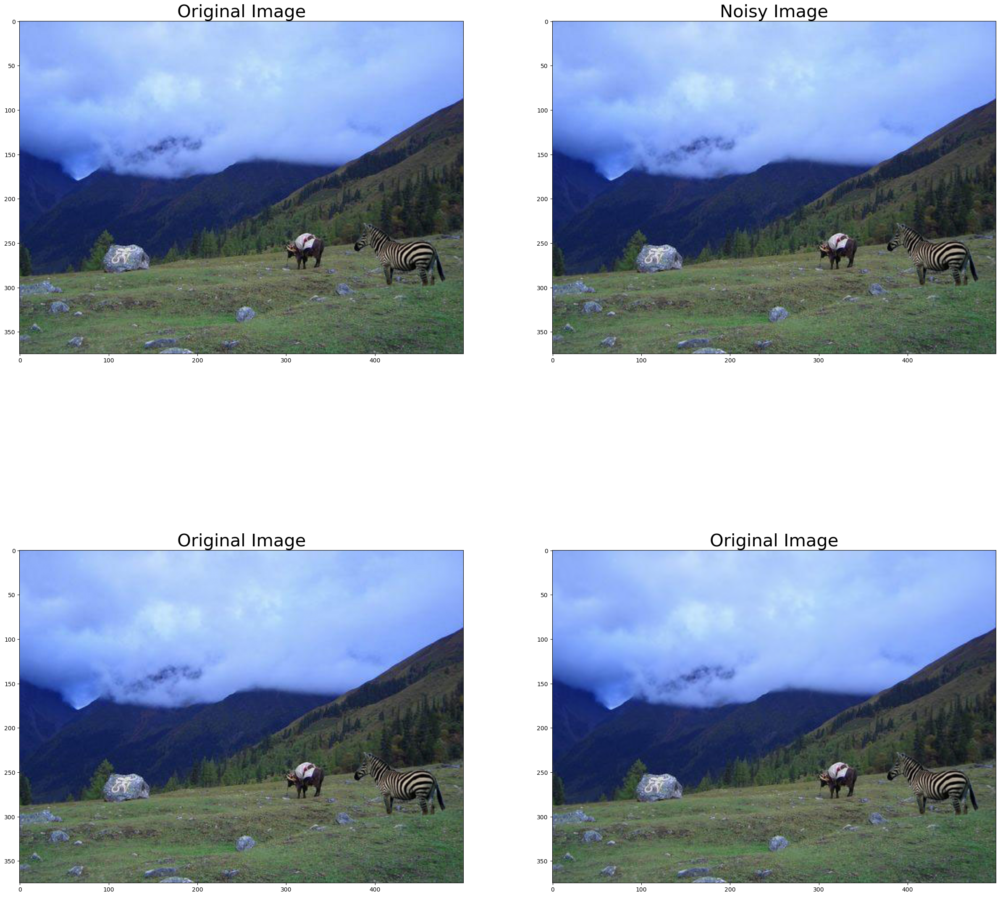

In [26]:
# Plotting images
plt.figure(figsize=(30,30))

plt.subplot(2,2,1)
plt.imshow(img_f,cmap=plt.cm.gray)
plt.title('Original Image',fontsize=30)

plt.subplot(2,2,2)
plt.imshow(img_f,cmap=plt.cm.gray)
plt.title('Noisy Image',fontsize=30)

plt.subplot(2,2,3)
plt.imshow(img_bayes,cmap=plt.cm.gray)
plt.title('Original Image',fontsize=30)

plt.subplot(2,2,4)
plt.imshow(img_visushrink,cmap=plt.cm.gray)
plt.title('Original Image',fontsize=30)

plt.show()

In [27]:
print('PSNR[Original vs. Noisy Image]', psnr_noisy)
print('PSNR[Original vs. Denoised(VisuShrink)]', psnr_visu)
print('PSNR[Original vs. Denoised(Bayes)]', psnr_bayes)

PSNR[Original vs. Noisy Image] 361.20199909921956
PSNR[Original vs. Denoised(VisuShrink)] 97.24783471476827
PSNR[Original vs. Denoised(Bayes)] 120.58626094108676


In [28]:
# Color-image denoising
from skimage.restoration import (denoise_wavelet,estimate_sigma)
from skimage.util import random_noise
# from sklearn.metrics import peak_signal_noise_ratio
import skimage.io

In [29]:
def denoise_img(img):
    #img=skimage.io.imread('../input/casia-dataset/CASIA2/Tp/Tp_D_NRN_S_N_ani10171_ani00001_12458.jpg')
    img=skimage.img_as_float(img_f) #converting image as float


    sigma_est=estimate_sigma(img,multichannel=True,average_sigmas=True)  #Noise estimation

    # Denoising using Bayes
    img_bayes=denoise_wavelet(img,method='BayesShrink',mode='soft',wavelet_levels=3,
                          wavelet='coif5',multichannel=True,convert2ycbcr=True,rescale_sigma=True)


    #Denoising using Visushrink
    img_visushrink=denoise_wavelet(img,method='VisuShrink',mode='soft',sigma=sigma_est/3,wavelet_levels=5,
    wavelet='coif5',multichannel=True,convert2ycbcr=True,rescale_sigma=True)
    return img_bayes 

In [30]:
image_size = (128, 128)

In [31]:
def prepare_image(image_path):
    return np.array(convert_to_ela_image(image_path, 91).resize(image_size)).flatten() / 255.0

In [32]:
X = [] # ELA converted images
Y = [] # 0 for fake, 1 for real

In [33]:
import random
import numpy as np
path = '../input/casia-dataset/CASIA2/Au/'
for dirname, _, filenames in os.walk(path):
    for filename in filenames:
        if filename.endswith('jpg') or filename.endswith('png'):
            full_path = os.path.join(dirname, filename)
            X.append(prepare_image(full_path))
            Y.append(1)
            if len(Y) % 500 == 0:
                print(f'Processing {len(Y)} images')

random.shuffle(X)
X = X[:2100]
Y = Y[:2100]
print(len(X), len(Y))

Processing 500 images
Processing 1000 images
Processing 1500 images
Processing 2000 images
Processing 2500 images
Processing 3000 images
Processing 3500 images
Processing 4000 images
Processing 4500 images
Processing 5000 images
Processing 5500 images
Processing 6000 images
Processing 6500 images
Processing 7000 images
2100 2100


In [34]:
path = '../input/casia-dataset/CASIA2/Tp/'
for dirname, _, filenames in os.walk(path):
    for filename in filenames:
        if filename.endswith('jpg') or filename.endswith('png'):
            full_path = os.path.join(dirname, filename)
            X.append(prepare_image(full_path))
            Y.append(0)
            if len(Y) % 500 == 0:
                print(f'Processing {len(Y)} images')

print(len(X), len(Y))

Processing 2500 images
Processing 3000 images
Processing 3500 images
Processing 4000 images
4164 4164


In [35]:
import numpy as np
X = np.array(X)
Y = to_categorical(Y, 2)
X = X.reshape(-1, 128, 128, 3)

In [36]:
from sklearn.model_selection import train_test_split

# Assuming X and Y are already defined

X_train, X_val, Y_train, Y_val = train_test_split(X, Y, test_size=0.2, random_state=5)
X = X.reshape(-1, 1, 1, 1)

print(len(X_train), len(Y_train))
print(len(X_val), len(Y_val))


3331 3331
833 833


In [37]:
def build_model():
    model = Sequential()
    model.add(Conv2D(filters = 32, kernel_size = (5, 5), padding = 'valid', activation = 'relu', input_shape = (128, 128, 3)))
    model.add(Conv2D(filters = 32, kernel_size = (5, 5), padding = 'valid', activation = 'relu', input_shape = (128, 128, 3)))
    model.add(MaxPool2D(pool_size = (2, 2)))
    model.add(Dropout(0.25))
    model.add(Flatten())
    model.add(Dense(256, activation = 'relu'))
    model.add(Dropout(0.5))
    model.add(Dense(2, activation = 'softmax'))
    return model

In [38]:
model = build_model()
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 124, 124, 32)      2432      
                                                                 
 conv2d_1 (Conv2D)           (None, 120, 120, 32)      25632     
                                                                 
 max_pooling2d (MaxPooling2D  (None, 60, 60, 32)       0         
 )                                                               
                                                                 
 dropout (Dropout)           (None, 60, 60, 32)        0         
                                                                 
 flatten (Flatten)           (None, 115200)            0         
                                                                 
 dense (Dense)               (None, 256)               29491456  
                                                        

In [39]:
from keras import optimizers
model.compile(loss='categorical_crossentropy', optimizer='Nadam', metrics=['accuracy'])

In [40]:
epochs = 24
batch_size = 10

In [41]:
from keras.models import Sequential
from keras.layers import Dense, Flatten, Conv2D, MaxPool2D, Dropout
from keras.optimizers import Adam
from keras.preprocessing.image import ImageDataGenerator

# Define your initial learning rate
init_lr = 1e-4

# Define your optimizer without using deprecated arguments
optimizer = Adam(learning_rate=init_lr)

In [42]:
early_stopping = EarlyStopping(monitor = 'val_acc',
                              min_delta = 0,
                              patience = 2,
                              verbose = 0,
                              mode = 'auto')

In [43]:

from tensorflow import keras
from keras.preprocessing.image import ImageDataGenerator
x_train2 = np.array(X_train, copy=True) 
y_train2 = np.array(Y_train, copy=True) 

datagen = ImageDataGenerator(
    featurewise_center=True,
    featurewise_std_normalization=True,
    rotation_range=10,
    fill_mode='nearest',
    validation_split = 0.2
    )


# compute quantities required for featurewise normalization
# (std, mean, and principal components if ZCA whitening is applied)

datagen.fit(X_train)

print(type(X_train))

#earlystopping = keras.callbacks.EarlyStopping(monitor='val_loss', min_delta=0, patience=30, verbose=0, mode='min')

validation_generator = datagen.flow(x_train2, y_train2, batch_size=10, subset='validation')
train_generator = datagen.flow(x_train2, y_train2,batch_size=10, subset='training')


# # fits the model on batches with real-time data augmentation:
history = model.fit_generator(train_generator, epochs=epochs, validation_data = (X_val,Y_val), verbose = 1,callbacks = [early_stopping])

<class 'numpy.ndarray'>
Epoch 1/24


/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:29: UserWarning: `Model.fit_generator` is deprecated and will be removed in a future version. Please use `Model.fit`, which supports generators.
2024-09-25 08:52:17.747939: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:954] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape insequential/dropout/dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


267/267 [==============================] - 19s 41ms/step - loss: 0.6630 - accuracy: 0.7854 - val_loss: 0.6735 - val_accuracy: 0.4886
Epoch 2/24
267/267 [==============================] - 10s 38ms/step - loss: 0.4218 - accuracy: 0.8529 - val_loss: 0.6764 - val_accuracy: 0.4886
Epoch 3/24
267/267 [==============================] - 10s 38ms/step - loss: 0.3791 - accuracy: 0.8754 - val_loss: 0.6983 - val_accuracy: 0.4886
Epoch 4/24
267/267 [==============================] - 10s 38ms/step - loss: 0.3432 - accuracy: 0.8829 - val_loss: 0.6694 - val_accuracy: 0.5018
Epoch 5/24
267/267 [==============================] - 10s 38ms/step - loss: 0.2981 - accuracy: 0.8957 - val_loss: 0.7203 - val_accuracy: 0.4886
Epoch 6/24
267/267 [==============================] - 10s 39ms/step - loss: 0.2734 - accuracy: 0.9043 - val_loss: 0.7170 - val_accuracy: 0.4886
Epoch 7/24
267/267 [==============================] - 10s 38ms/step - loss: 0.2288 - accuracy: 0.9122 - val_loss: 0.7185 - val_accuracy: 0.4886
Epo

In [44]:
model.compile(optimizer = optimizer, loss = 'binary_crossentropy', metrics = ['accuracy'])

In [45]:
hist = model.fit(X_train,
                 
                 Y_train,
                 batch_size = batch_size,
                 epochs = epochs,
                validation_data = (X_val, Y_val),
                callbacks = [early_stopping])

Epoch 1/24
  5/334 [..............................] - ETA: 4s - loss: 0.6248 - accuracy: 0.7200  

2024-09-25 08:56:35.964916: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:954] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape insequential/dropout/dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


334/334 [==============================] - 6s 15ms/step - loss: 0.4360 - accuracy: 0.7968 - val_loss: 0.2474 - val_accuracy: 0.9256
Epoch 2/24
334/334 [==============================] - 5s 14ms/step - loss: 0.2309 - accuracy: 0.9096 - val_loss: 0.2172 - val_accuracy: 0.9292
Epoch 3/24
334/334 [==============================] - 5s 14ms/step - loss: 0.2005 - accuracy: 0.9216 - val_loss: 0.2042 - val_accuracy: 0.9340
Epoch 4/24
334/334 [==============================] - 5s 14ms/step - loss: 0.1733 - accuracy: 0.9319 - val_loss: 0.1952 - val_accuracy: 0.9280
Epoch 5/24
334/334 [==============================] - 5s 14ms/step - loss: 0.1520 - accuracy: 0.9409 - val_loss: 0.1916 - val_accuracy: 0.9280
Epoch 6/24
334/334 [==============================] - 5s 13ms/step - loss: 0.1348 - accuracy: 0.9445 - val_loss: 0.1839 - val_accuracy: 0.9340
Epoch 7/24
334/334 [==============================] - 5s 14ms/step - loss: 0.1155 - accuracy: 0.9523 - val_loss: 0.2017 - val_accuracy: 0.9340
Epoch 8/24

In [46]:
model.save('model_casia_run1.h5')

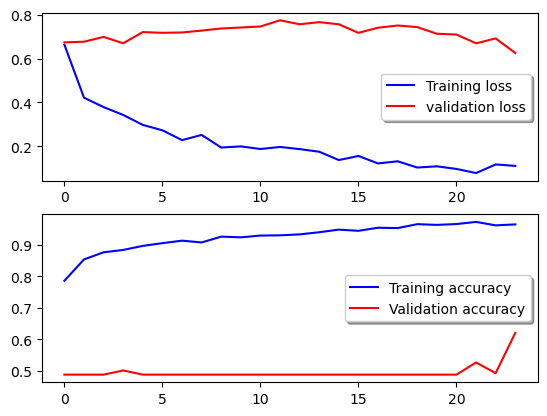

In [47]:
# Plot the loss and accuracy curves for training and validation 
fig, ax = plt.subplots(2,1)
ax[0].plot(history.history['loss'], color='b', label="Training loss")
ax[0].plot(history.history['val_loss'], color='r', label="validation loss",axes =ax[0])
legend = ax[0].legend(loc='best', shadow=True)

ax[1].plot(history.history['accuracy'], color='b', label="Training accuracy")
ax[1].plot(history.history['val_accuracy'], color='r',label="Validation accuracy")
legend = ax[1].legend(loc='best', shadow=True)

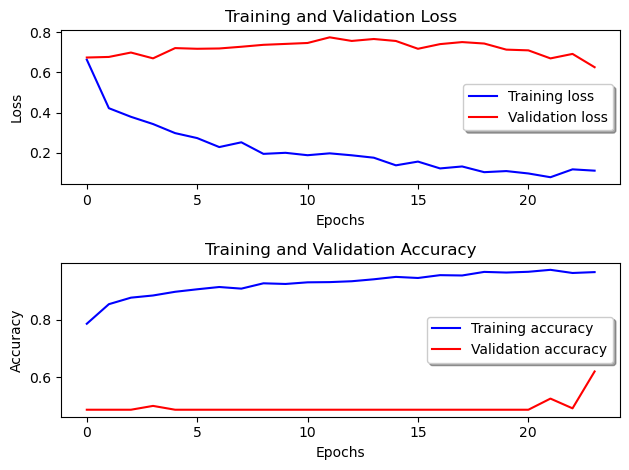

In [48]:
import matplotlib.pyplot as plt

# Create a figure with two subplots, one for loss and one for accuracy
fig, ax = plt.subplots(2, 1)

# Plot training and validation loss
ax[0].plot(history.history['loss'], color='b', label="Training loss")
ax[0].plot(history.history['val_loss'], color='r', label="Validation loss")
ax[0].set_xlabel('Epochs')
ax[0].set_ylabel('Loss')
ax[0].set_title('Training and Validation Loss')
ax[0].legend(loc='best', shadow=True)

# Plot training and validation accuracy
ax[1].plot(history.history['accuracy'], color='b', label="Training accuracy")
ax[1].plot(history.history['val_accuracy'], color='r', label="Validation accuracy")
ax[1].set_xlabel('Epochs')
ax[1].set_ylabel('Accuracy')
ax[1].set_title('Training and Validation Accuracy')
ax[1].legend(loc='best', shadow=True)

# Display the plots
plt.tight_layout()
plt.show()


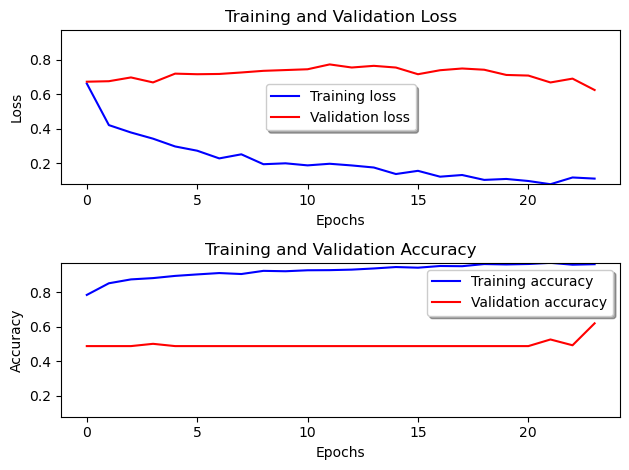

In [49]:
import matplotlib.pyplot as plt

# Create a figure with two subplots, one for loss and one for accuracy
fig, ax = plt.subplots(2, 1)

# Determine the common y-axis limits for loss and accuracy
min_loss = min(min(history.history['loss']), min(history.history['val_loss']))
max_loss = max(max(history.history['loss']), max(history.history['val_loss']))
min_acc = min(min(history.history['accuracy']), min(history.history['val_accuracy']))
max_acc = max(max(history.history['accuracy']), max(history.history['val_accuracy']))

# Set common y-axis limits
common_min = min(min_loss, min_acc)
common_max = max(max_loss, max_acc)

# Plot training and validation loss
ax[0].plot(history.history['loss'], color='b', label="Training loss")
ax[0].plot(history.history['val_loss'], color='r', label="Validation loss")
ax[0].set_ylim(common_min, common_max)  # Set the y-axis limits
ax[0].set_xlabel('Epochs')
ax[0].set_ylabel('Loss')
ax[0].set_title('Training and Validation Loss')
ax[0].legend(loc='best', shadow=True)

# Plot training and validation accuracy
ax[1].plot(history.history['accuracy'], color='b', label="Training accuracy")
ax[1].plot(history.history['val_accuracy'], color='r', label="Validation accuracy")
ax[1].set_ylim(common_min, common_max)  # Set the y-axis limits
ax[1].set_xlabel('Epochs')
ax[1].set_ylabel('Accuracy')
ax[1].set_title('Training and Validation Accuracy')
ax[1].legend(loc='best', shadow=True)

# Display the plots
plt.tight_layout()
plt.show()


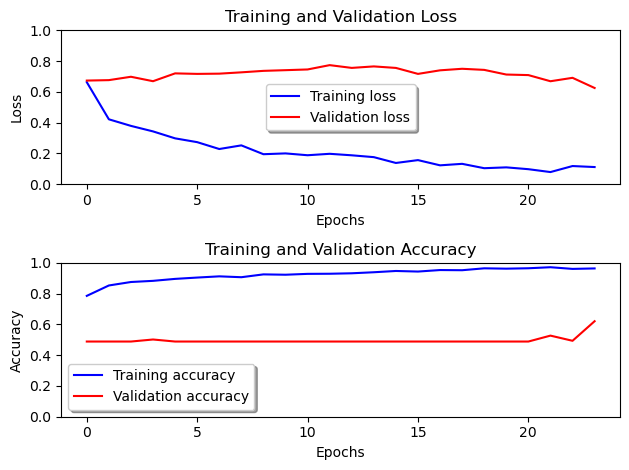

In [50]:
import matplotlib.pyplot as plt

# Create a figure with two subplots, one for loss and one for accuracy
fig, ax = plt.subplots(2, 1)

# Define the common y-axis ticks and limits
y_ticks = [0, 0.2, 0.4, 0.6, 0.8, 1]

# Plot training and validation loss
ax[0].plot(history.history['loss'], color='b', label="Training loss")
ax[0].plot(history.history['val_loss'], color='r', label="Validation loss")
ax[0].set_ylim(0, 1)  # Set y-axis limits from 0 to 1
ax[0].set_yticks(y_ticks)  # Set y-axis ticks
ax[0].set_xlabel('Epochs')
ax[0].set_ylabel('Loss')
ax[0].set_title('Training and Validation Loss')
ax[0].legend(loc='best', shadow=True)

# Plot training and validation accuracy
ax[1].plot(history.history['accuracy'], color='b', label="Training accuracy")
ax[1].plot(history.history['val_accuracy'], color='r', label="Validation accuracy")
ax[1].set_ylim(0, 1)  # Set y-axis limits from 0 to 1
ax[1].set_yticks(y_ticks)  # Set y-axis ticks
ax[1].set_xlabel('Epochs')
ax[1].set_ylabel('Accuracy')
ax[1].set_title('Training and Validation Accuracy')
ax[1].legend(loc='best', shadow=True)

# Display the plots
plt.tight_layout()
plt.show()


In [51]:
def plot_confusion_matrix(cm, classes,
                          normalize=False,
                          title='Confusion matrix',
                          cmap=plt.cm.Blues):
    """
    This function prints and plots the confusion matrix.
    Normalization can be applied by setting `normalize=True`.
    """
    plt.imshow(cm, interpolation='nearest', cmap=cmap)
    plt.title(title)
    plt.colorbar()
    tick_marks = np.arange(len(classes))
    plt.xticks(tick_marks, classes, rotation=45)
    plt.yticks(tick_marks, classes)

    if normalize:
        cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]

    thresh = cm.max() / 2.
    for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
        plt.text(j, i, cm[i, j],
                 horizontalalignment="center",
                 color="white" if cm[i, j] > thresh else "black")

    plt.tight_layout()
    plt.ylabel('True label')
    plt.xlabel('Predicted label')
        

27/27 [==============================] - 0s 6ms/step


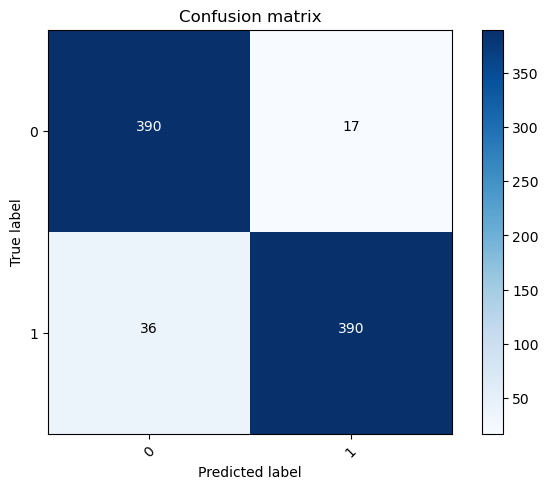

In [52]:
from sklearn.metrics import confusion_matrix

# Predict the values from the validation dataset
Y_pred = model.predict(X_val)
# Convert predictions classes to one hot vectors 
Y_pred_classes = np.argmax(Y_pred,axis = 1) 
# Convert validation observations to one hot vectors
Y_true = np.argmax(Y_val,axis = 1) 
# compute the confusion matrix
confusion_mtx = confusion_matrix(Y_true, Y_pred_classes) 
# plot the confusion matrix
plot_confusion_matrix(confusion_mtx, classes = range(2))

In [53]:
class_names = ['fake', 'real']

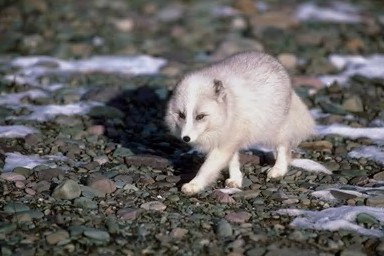

In [54]:
real_image_path = '../input/casia-dataset/CASIA2/Au/Au_ani_00040.jpg'
Image.open(real_image_path)

In [55]:
image = prepare_image(real_image_path)
image = image.reshape(-1, 128, 128, 3)
y_pred = model.predict(image)
y_pred_class = np.argmax(y_pred, axis = 1)[0]
print(f'Class: {class_names[y_pred_class]} Confidence: {np.amax(y_pred) * 100:0.2f}')

1/1 [==============================] - 0s 21ms/step
Class: real Confidence: 100.00


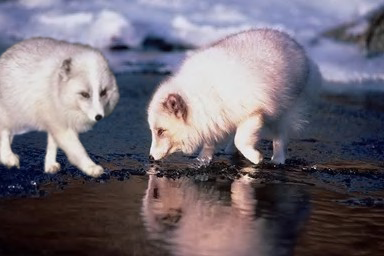

In [56]:
fake_image_path = '/kaggle/input/casia-dataset/CASIA2/Tp/Tp_D_NRD_S_N_ani00041_ani00040_00161.tif'
Image.open(fake_image_path)

In [57]:
image = prepare_image(fake_image_path)
image = image.reshape(-1, 128, 128, 3)
y_pred = model.predict(image)
y_pred_class = np.argmax(y_pred, axis = 1)[0]
print(f'Class: {class_names[y_pred_class]} Confidence: {np.amax(y_pred) * 100:0.2f}')

1/1 [==============================] - 0s 20ms/step
Class: fake Confidence: 100.00


In [58]:
fake_image = os.listdir('../input/casia-dataset/CASIA2/Tp/')
correct = 0
total = 0
for file_name in fake_image:
    if file_name.endswith('jpg') or filename.endswith('png'):
        fake_image_path = os.path.join('../input/casia-dataset/CASIA2/Tp/', file_name)
        image = prepare_image(fake_image_path)
        image = image.reshape(-1, 128, 128, 3)
        y_pred = model.predict(image)
        y_pred_class = np.argmax(y_pred, axis = 1)[0]
        total += 1
        if y_pred_class == 0:
            correct += 1
#             print(f'Class: {class_names[y_pred_class]} Confidence: {np.amax(y_pred) * 100:0.2f}')

1/1 [==============================] - 0s 21ms/step


In [59]:
print(f'Total: {total}, Correct: {correct}, Acc: {correct / total * 100.0}')

Total: 2064, Correct: 2047, Acc: 99.17635658914729


In [60]:
real_image = os.listdir('../input/casia-dataset/CASIA2/Au/')
correct_r = 0
total_r = 0
for file_name in real_image:
    if file_name.endswith('jpg') or filename.endswith('png'):
        real_image_path = os.path.join('../input/casia-dataset/CASIA2/Au/', file_name)
        image = prepare_image(real_image_path)
        image = image.reshape(-1, 128, 128, 3)
        y_pred = model.predict(image)
        y_pred_class = np.argmax(y_pred, axis = 1)[0]
        total_r += 1
        if y_pred_class == 1:
            correct_r += 1
#             print(f'Class: {class_names[y_pred_class]} Confidence: {np.amax(y_pred) * 100:0.2f}')

1/1 [==============================] - 0s 21ms/step


In [61]:
correct += correct_r
total += total_r
print(f'Total: {total_r}, Correct: {correct_r}, Acc: {correct_r / total_r * 100.0}')
print(f'Total: {total}, Correct: {correct}, Acc: {correct / total * 100.0}')

Total: 7354, Correct: 6796, Acc: 92.4122926298613
Total: 9418, Correct: 8843, Acc: 93.89466978126991


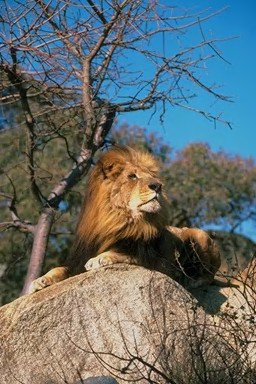

In [62]:
image_path1 = '/kaggle/input/casia-dataset/CASIA1/Au/Au_ani_0028.jpg'
Image.open(image_path1)

In [63]:
image = prepare_image(image_path1)
image = image.reshape(-1, 128, 128, 3)
y_pred = model.predict(image)
y_pred_class = np.argmax(y_pred, axis = 1)[0]
print(f'Class: {class_names[y_pred_class]} Confidence: {np.amax(y_pred) * 100:0.2f}')

1/1 [==============================] - 0s 21ms/step
Class: real Confidence: 100.00


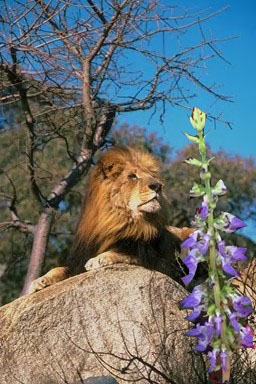

In [64]:
image_path2 = '/kaggle/input/casia-dataset/CASIA1/Sp/Sp_D_NNN_A_ani0028_pla0007_0284.jpg'
Image.open(image_path2)

In [65]:
image = prepare_image(image_path2)
image = image.reshape(-1, 128, 128, 3)
y_pred = model.predict(image)
y_pred_class = np.argmax(y_pred, axis = 1)[0]
print(f'Class: {class_names[y_pred_class]} Confidence: {np.amax(y_pred) * 100:0.2f}')

1/1 [==============================] - 0s 22ms/step
Class: fake Confidence: 99.95


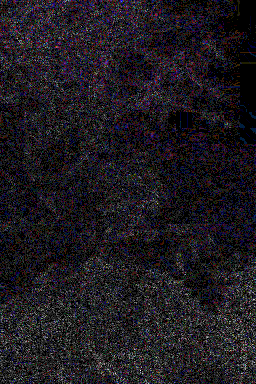

In [66]:
convert_to_ela_image(image_path1, 91)

In [67]:
image_1_ELA=convert_to_ela_image(image_path1, 91)

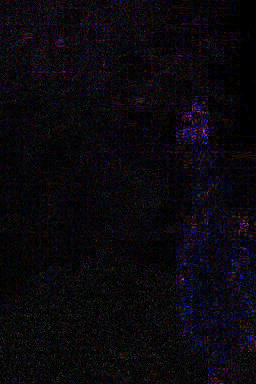

In [68]:
convert_to_ela_image(image_path2, 91)

In [69]:
image_2_ELA=convert_to_ela_image(image_path2, 91)

In [70]:
ela_image = ImageChops.difference(image_1_ELA, image_2_ELA)

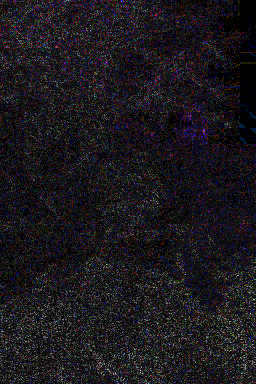

In [71]:
ela_image

In [72]:
print(y_pred_class)

0


In [73]:
def find_manipulated_region(ela, threshold=50):
    mask = np.array(ela) > threshold

    # Find the bounding box of the masked region
    if np.any(mask):
        coords = np.argwhere(mask)
        return coords
    else:
        return None

In [74]:
def make_pixels_white(img, white_coords):
    width, height = img.size
    black_img = Image.new('RGB', (width, height), color='black')
    img_arr = np.array(img)
    black_arr = np.array(black_img)
    for coord in white_coords:
        x, y, z = coord
        black_arr[x,y,:] = [255,255,255]
    mask = np.all(black_arr == [255,255,255], axis=-1)
    img_arr[mask] = [255,255,255]
    new_img = Image.fromarray(img_arr)
    return new_img

In [75]:
if y_pred_class==0:
    ela=convert_to_ela_image(image_path2,91)
    coords=find_manipulated_region(ela)
    modify_boundary=make_pixels_white(ela,coords)
    modify_boundary.show()